In [1]:
# importing required packages
import numpy
import cv2
from matplotlib import pyplot as plt
import os
from matplotlib import image
%matplotlib inline

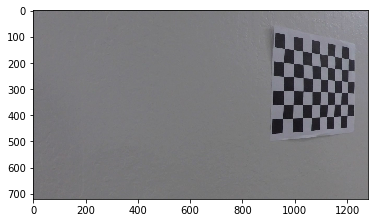

In [2]:
# read the test image for camera calibration
img=image.imread('camera_cal/calibration14.jpg')
plt.imshow(img)
plt.show()

# Camera Calibration

In [3]:
# arrays for storing imagepoints and objectpoints
imgpoints=[] # 3d points in real world space
objpoints=[] # 2d points from image plane

# prepare the objpoints
objp=numpy.zeros((54,3),dtype='float32')
objp[:,:2]=numpy.mgrid[0:9,0:6].T.reshape(-1,2)

# get the list of all images
for i in os.listdir("camera_cal"):
    if 'calibration' in i:
        img=image.imread('camera_cal/'+i)
        #converting the image into grayscale format
        gray=cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
        #finding corners from the image
        ret,corners=cv2.findChessboardCorners(gray,(9,6),None)
        #check for if the croners are fund and appending the corners in the imag points
        if ret==True:
            imgpoints.append(corners)
            objpoints.append(objp)
            #drawing the chessboard corners and displaying images for verification
            img=cv2.drawChessboardCorners(img,(9,6),corners,ret)
            cv2.imshow('img',img)
            cv2.waitKey(500)
cv2.destroyAllWindows()

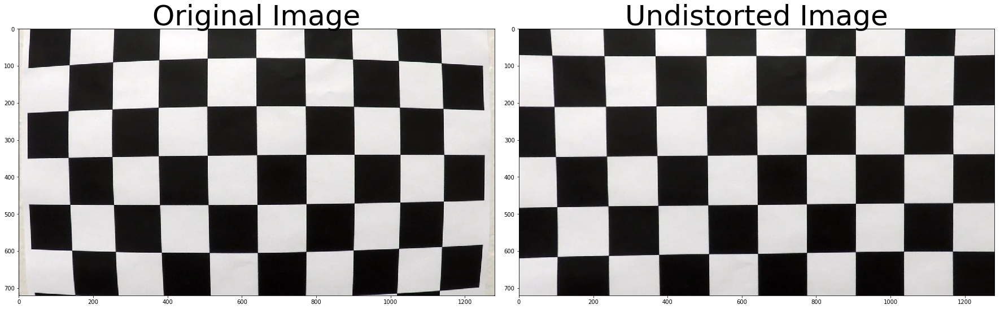

In [4]:
#Distortion Correction for image 1
def cal_undistort(img, objpoints, imgpoints):
    #getting mage size
    img_size=(img.shape[0],img.shape[1])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

#loading an image
img=image.imread('camera_cal/calibration1.jpg')
%matplotlib inline
undistorted = cal_undistort(img, objpoints, imgpoints)
# save the image
image.imsave('output_images/undistort_output1.jpg',undistorted)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

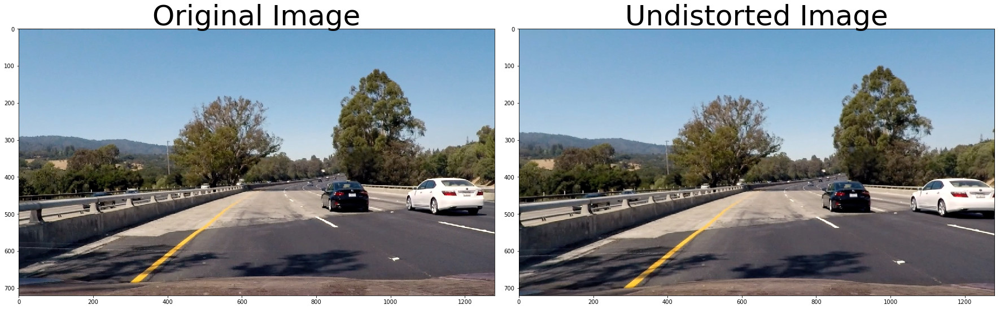

In [5]:
# testing the distortion on one of the test images
img=image.imread('test_images/test4.jpg')

undistorted = cal_undistort(img, objpoints, imgpoints)
# save the image
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Thresholded Binary Image

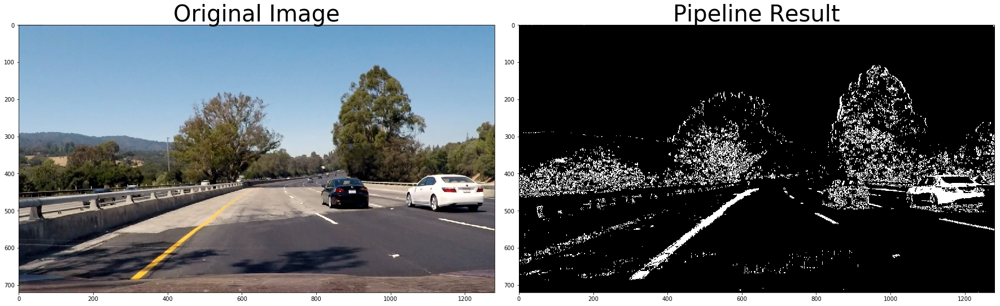

In [6]:
img = image.imread('test_images/test4.jpg')

# Edit this function to create your own pipeline.
def pipeline(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    # equalizatiion of pixel values to fight with shadow - suggested by reviewer
    #img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    #img[:,:,0] = cv2.equalizeHist(img[:,:,0])
    #img = cv2.cvtColor(img, cv2.COLOR_YUV2RGB)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    r_channel=img[:,:,0]
    r_thresh=[200,255]
    r_binary = numpy.zeros_like(r_channel)
    r_binary[(r_channel >= r_thresh[0]) & (r_channel <= r_thresh[1])] = 1
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    s_thresh=[90,255]
    s_binary = numpy.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    rs_binary = numpy.zeros_like(s_binary)
    rs_binary[(r_binary == 1) & (s_binary == 1)] = 1
    # Sobel x
    sobelx = cv2.Sobel(s_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = numpy.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = numpy.uint8(255*abs_sobelx/numpy.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = numpy.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    #s_binary = numpy.zeros_like(s_channel)
    #s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Combine the two binary thresholds
    combined_binary = numpy.zeros_like(sxbinary)
    combined_binary[(rs_binary == 1) | (sxbinary == 1)] = 1
    # performing morphological transformation for removing noise from the binary thresholded image
    # first performing the erosion process and then the dilation process
    #kernel = numpy.ones((2,2),numpy.uint8)
    #erosion = cv2.erode(combined_binary,kernel,iterations = 1)
    #combined_binary = cv2.dilate(erosion,kernel,iterations = 1)
    return combined_binary
    
result = pipeline(img)
%matplotlib inline
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=40)
ax2.imshow(result,cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

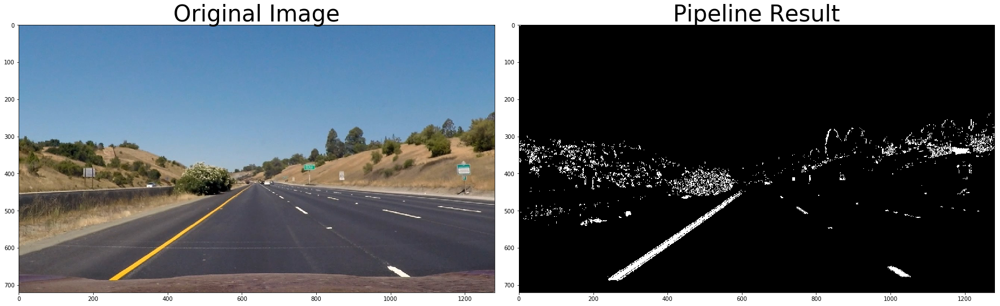

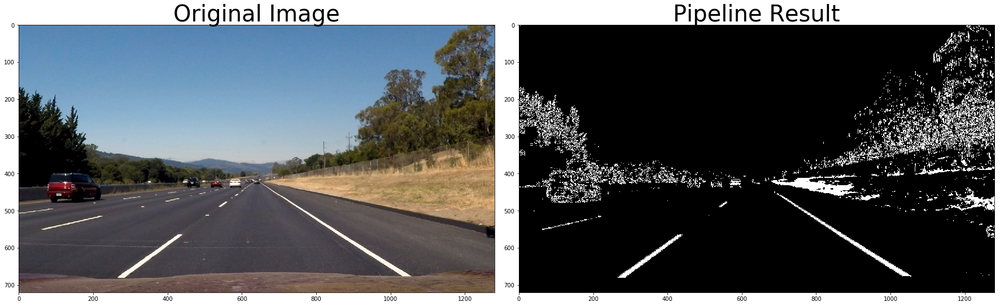

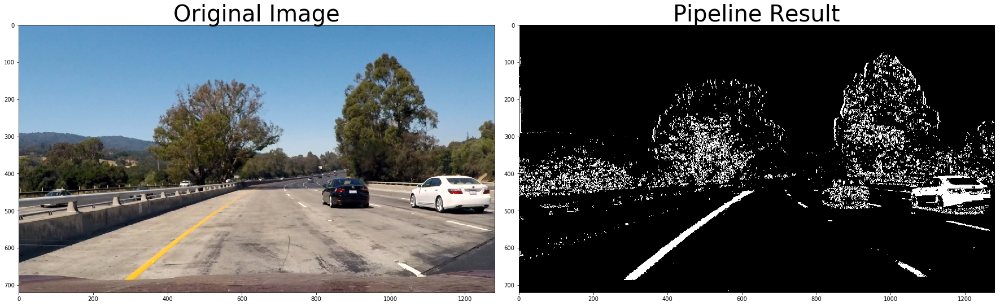

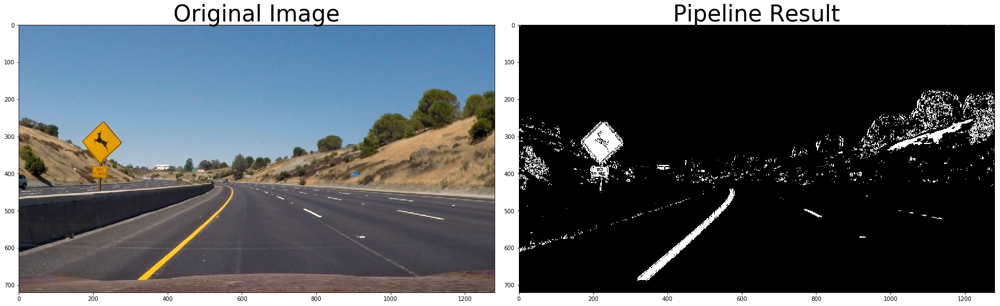

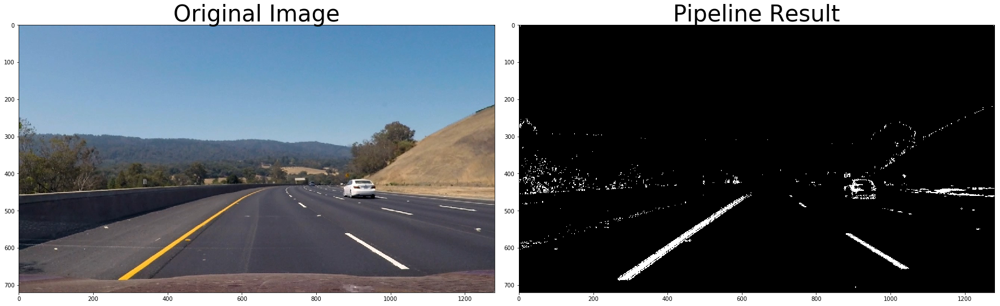

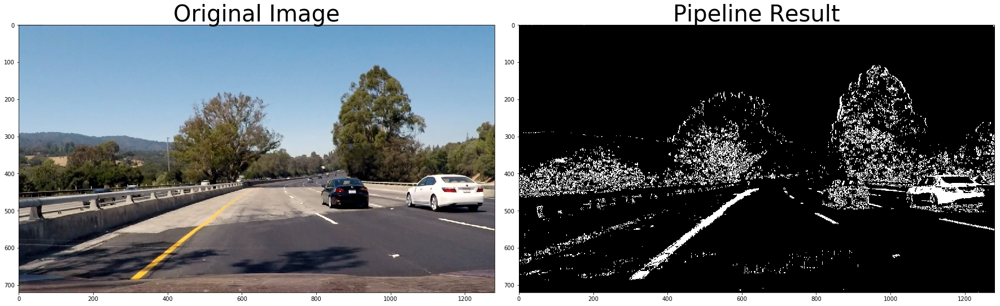

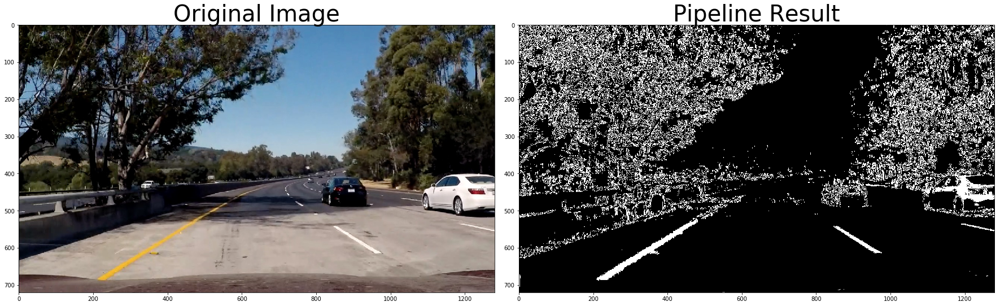

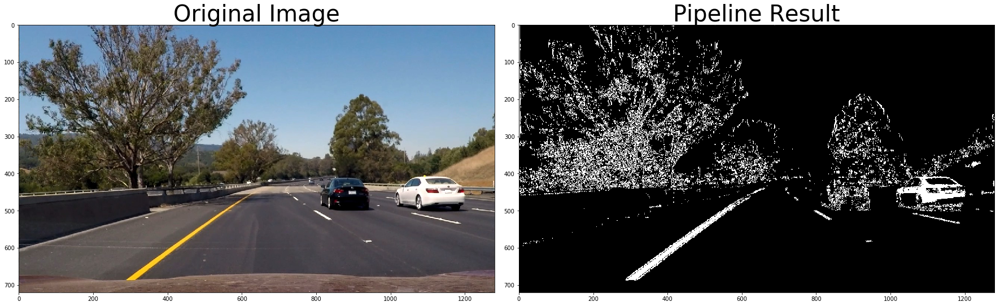

In [7]:
#testing the filter for all test images
for i in os.listdir('test_images'):
    if '.jpg' in i:
        img=image.imread('test_images/'+i)
        result=pipeline(img)
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=40)
    ax2.imshow(result,cmap='gray')
    ax2.set_title('Pipeline Result', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Prespective transform

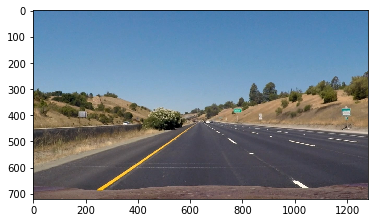

(720, 1280, 3)

In [8]:
img=image.imread('test_images/straight_lines1.jpg')
plt.imshow(img)
plt.show()
img.shape

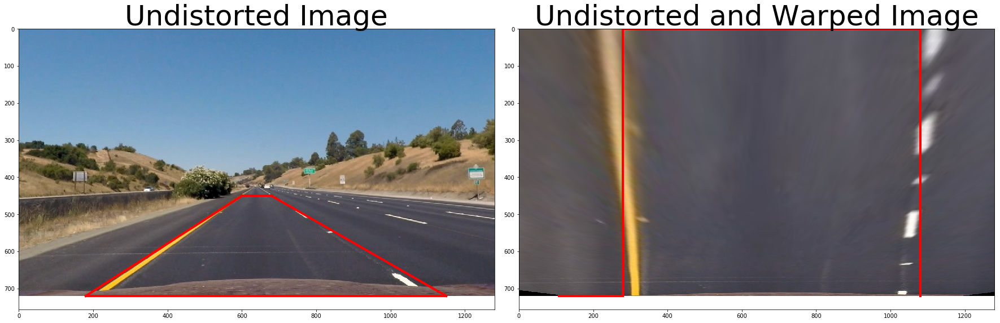

In [9]:
img=image.imread('test_images/straight_lines1.jpg')

def warper(img):
    img=cal_undistort(img,objpoints,imgpoints)
    img_size = (img.shape[1], img.shape[0])
    src = numpy.float32([[180,710],[1150,710],[680,450],[600,450]])
    dst = numpy.float32([[280, img_size[1]], [1080, img_size[1]],[1080, 0],[280, 0]])
    # Compute and apply perpective transform
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)  # keep same size as input image
    return warped,Minv

img_size = (img.shape[1], img.shape[0])
undistorted_img=cal_undistort(img,objpoints,imgpoints)
warped_img,Minv= warper(img)
%matplotlib inline
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(undistorted_img)
ax1.plot([180,1150],[img_size[1],img_size[1]],c='r',linewidth=4)
ax1.plot([1150,680],[img_size[1],450],c='r',linewidth=4)
ax1.plot([680,600],[450,450],c='r',linewidth=4)
ax1.plot([600,180],[450,img_size[1]],c='r',linewidth=4)
ax1.set_title('Undistorted Image', fontsize=50)
ax2.imshow(warped_img)
ax2.set_title('Undistorted and Warped Image', fontsize=50)
ax2.plot([280,108],[img_size[1],img_size[1]],c='r',linewidth=4)
ax2.plot([1080,1080],[img_size[1],0],c='r',linewidth=4)
ax2.plot([1080,280],[0,0],c='r',linewidth=4)
ax2.plot([280,280],[0,img_size[1]],c='r',linewidth=4)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

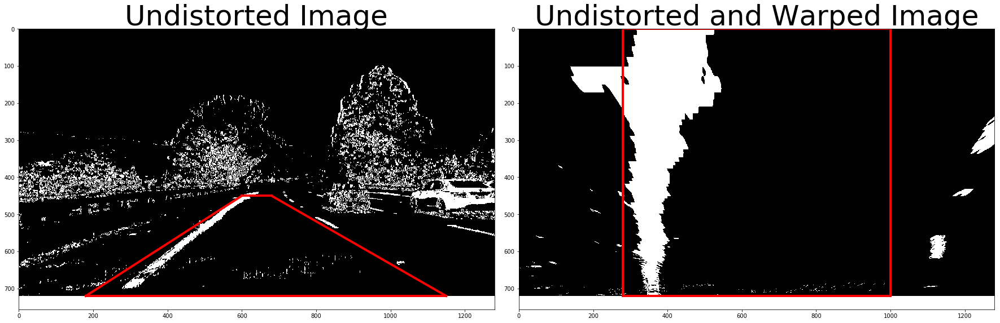

In [10]:
# applying prespectice transform for a binary image
img=image.imread('test_images/test4.jpg')
img=pipeline(img)
img_size = (img.shape[1], img.shape[0])
undistorted_img=cal_undistort(img,objpoints,imgpoints)
warped_img,Minv= warper(img)
%matplotlib inline
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(undistorted_img,cmap='gray')
ax1.plot([180,1150],[img_size[1],img_size[1]],c='r',linewidth=4)
ax1.plot([1150,680],[img_size[1],450],c='r',linewidth=4)
ax1.plot([680,600],[450,450],c='r',linewidth=4)
ax1.plot([600,180],[450,img_size[1]],c='r',linewidth=4)
ax1.set_title('Undistorted Image', fontsize=50)
ax2.imshow(warped_img,cmap='gray')
ax2.set_title('Undistorted and Warped Image', fontsize=50)
ax2.plot([280,1000],[img_size[1],img_size[1]],c='r',linewidth=4)
ax2.plot([1000,1000],[img_size[1],0],c='r',linewidth=4)
ax2.plot([1000,280],[0,0],c='r',linewidth=4)
ax2.plot([280,280],[0,img_size[1]],c='r',linewidth=4)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

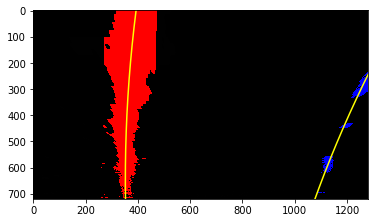

In [11]:

def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = numpy.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = numpy.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = numpy.int(histogram.shape[0]//2)
    leftx_base = numpy.argmax(histogram[:midpoint])
    rightx_base = numpy.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = numpy.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = numpy.array(nonzero[0])
    nonzerox = numpy.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin  # Update this
        win_xleft_high = leftx_current + margin  # Update this
        win_xright_low = rightx_current - margin  # Update this
        win_xright_high = rightx_current + margin  # Update this
         
        
        ### TO-DO: Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy>=win_y_low) & (nonzeroy<win_y_high) & 
        (nonzerox>=win_xleft_low) & (nonzerox<win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy>=win_y_low) & (nonzeroy<win_y_high) & 
        (nonzerox>=win_xright_low) & (nonzerox<win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### TO-DO: If you found > minpix pixels, recenter next window ###
        if len(good_left_inds) > minpix:
            leftx_current = numpy.int(numpy.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = numpy.int(numpy.mean(nonzerox[good_right_inds]))
        ### (`right` or `leftx_current`) on their mean position ###
     
    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = numpy.concatenate(left_lane_inds)
        right_lane_inds = numpy.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped,left_fit,right_fit,ploty,plotlines=True):

    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    
    if plotlines==True:
        # Plots the left and right polynomials on the lane lines
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')

    return out_img,left_fitx,right_fitx

leftx, lefty, rightx, righty, out_img = find_lane_pixels(warped_img)
left_fit = numpy.polyfit(lefty,leftx,2)
right_fit = numpy.polyfit(righty,rightx,2)
ploty = numpy.linspace(0, warped_img.shape[0]-1, warped_img.shape[0] )
out_img,left_fitx,right_fitx = fit_polynomial(warped_img,left_fit,right_fit,ploty)

plt.imshow(out_img)

In [12]:
def search_around_poly(binary_warped,left_fit=None,right_fit=None,radius=0):
    # Choose the width of the margin around the previous polynomial to search
    if right_fit ==None or left_fit==None:
        return find_lane_pixels(binary_warped)
    if radius<100 or radius>4000:
        return find_lane_pixels(binary_warped)
    
    margin = 100
    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = numpy.array(nonzero[0])
    nonzerox = numpy.array(nonzero[1])
    #here noe we are going to use a plynomial fit on values obtained from previous frames
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    out_img = numpy.dstack((binary_warped, binary_warped, binary_warped))
    if leftx.size==0 or rightx.size==0:
        return find_lane_pixels(binary_warped)
    return leftx,lefty,rightx,righty,out_img


In [13]:
def measure_curvature(binary_warped,leftx,lefty,rightx,righty,ploty):    
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/800 # meters per pixel in x dimension
    ### TO-DO: Fit a second order polynomial to each using `np.polyfit` ###
    left_fit = numpy.polyfit(lefty*ym_per_pix,leftx*xm_per_pix,2)
    right_fit = numpy.polyfit(righty*ym_per_pix,rightx*xm_per_pix,2) 
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = numpy.max(ploty)
    
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit[0]*y_eval*ym_per_pix + left_fit[1])**2)**1.5) / numpy.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval*ym_per_pix + right_fit[1])**2)**1.5) / numpy.absolute(2*right_fit[0])
    
    # Calculate position of the car  
    left_fit = numpy.polyfit(lefty, leftx, 2)
    right_fit = numpy.polyfit(righty, rightx, 2)
    l_fit = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    r_fit = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    lane_midpoint_position = (r_fit[719] + l_fit[719]) / 2
    center_of_image = 640 # assuming camare is mounted at the center of the car
    distance_from_center = abs((center_of_image - lane_midpoint_position)* xm_per_pix)
    
    return left_curverad*0.5+right_curverad*0.5, distance_from_center

leftx, lefty, rightx, righty, out_img = find_lane_pixels(warped_img)
ploty = numpy.linspace(0, warped_img.shape[0]-1, warped_img.shape[0] )
# Calculate the radius of curvature in pixels for both lane lines
radius_of_curvature,distance_from_center = measure_curvature(warped_img,leftx,lefty,rightx,righty,ploty)

print(radius_of_curvature,distance_from_center)

1619.0621274475488 0.3479273948408204


In [14]:
class main_pipeline():
    def __init__(self,img):
        self.left_fit=None
        self.right_fit=None
        self.radius=0
        self.img=img.copy()
        
    def get_out(self):
        
        global left_fit_known
        global right_fit_known
        #Binary thresholding
        self.binary = pipeline(self.img)
        # getting the binary waroed image
        self.binary_warped_img,Minv=warper(self.binary)
        # Generate x and y values for plotting
        ploty = numpy.linspace(0, self.binary_warped_img.shape[0]-1, self.binary_warped_img.shape[0] )
        # using search around the values from previous frames
        leftx, lefty, rightx, righty,out_img = search_around_poly(self.binary_warped_img,self.left_fit,self.right_fit,self.radius)
        #getting radius of curvature and distance from center
        self.radius,self.distance = measure_curvature(self.binary_warped_img,leftx,lefty,rightx,righty,ploty)
        #fitting a second order polynomial
        if leftx.size != 0 and rightx.size != 0 and self.radius>200 and self.distance>0.09:
            self.left_fit = numpy.polyfit(lefty,leftx,2)
            self.right_fit = numpy.polyfit(righty,rightx,2)
        else:
            self.left_fit=left_fit_known
            self.right_fit = right_fit_known
        left_fit_known = self.left_fit
        right_fit_known = self.right_fit
        out_img,left_fitx,right_fitx = fit_polynomial(self.binary_warped_img,self.left_fit,self.right_fit,ploty,plotlines=False)
        
        warp_zero = numpy.zeros_like(self.binary_warped_img).astype(numpy.uint8)
        color_warp = numpy.dstack((warp_zero, warp_zero, warp_zero))
        # Recast the x and y points into usable format for cv2.fillPoly()
        pts_left = numpy.array([numpy.transpose(numpy.vstack([left_fitx, ploty]))])
        pts_right = numpy.array([numpy.flipud(numpy.transpose(numpy.vstack([right_fitx, ploty])))])
        pts = numpy.hstack((pts_left, pts_right))
    
        # Draw the lane onto the warped blank image
        cv2.fillPoly(color_warp, numpy.int_([pts]), (0,255, 0))
    
        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        newwarp = cv2.warpPerspective(color_warp, Minv, (self.img.shape[1], self.img.shape[0])) 
    
        newimageundist=cal_undistort(self.img,objpoints,imgpoints)
        # Combine the result with the original image
        self.result = cv2.addWeighted(newimageundist, 1, newwarp, 0.3, 0)
            
        #annotating the result   
        text1="Radius of Curvature = "+str(self.radius)+' m'
        if self.distance>0:
            text2= "Vehicle is "+str(self.distance)+' right of center'
        else:
            text2= "Vehicle is "+str(self.distance)+' left of center'
        cv2.putText(self.result,text1,(50,50),cv2.FONT_HERSHEY_DUPLEX,1.5,(255,255,255),2)
        cv2.putText(self.result,text2,(50,100),cv2.FONT_HERSHEY_DUPLEX,1.5,(255,255,255),2)

        return self.result


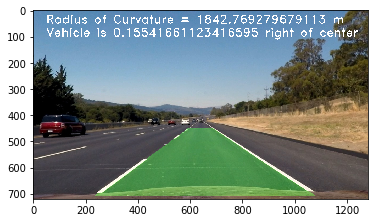

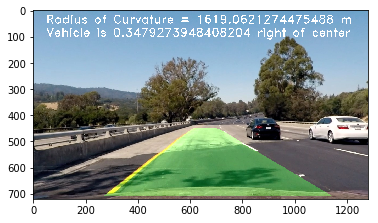

In [15]:
def final_pipeline(img):
    result = main_pipeline(img)
    out=result.get_out()
    return out

%matplotlib inline
# Test pipeline created for video
img=image.imread('test_images/straight_lines2.jpg')
out=final_pipeline(img)
plt.imshow(out)
plt.show()
img=image.imread('test_images/test4.jpg')
out=final_pipeline(img)
plt.imshow(out)
plt.show()

In [16]:
import imageio
imageio.plugins.ffmpeg.download()
from moviepy.editor import VideoFileClip
from IPython.display import HTML

video_output = 'output_video.mp4'
clip1 = VideoFileClip("project_video.mp4")
video_clip = clip1.fl_image(final_pipeline)
%time video_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video output_video.mp4
[MoviePy] Writing video output_video.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [42:42<00:02,  2.15s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_video.mp4 

Wall time: 42min 43s


In [17]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))